In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import os

In [3]:
uber_15 = pd.read_csv(r"C:\Users\Abdullah\OneDrive - Institute of Business Administration\Documents\Datasets/uber-raw-data-janjune-15_sample.csv")

In [4]:
print(uber_15)

      Dispatching_base_num          Pickup_date Affiliated_base_num  \
0                   B02617  2015-05-02 21:43:00              B02764   
1                   B02682  2015-01-20 19:52:59              B02682   
2                   B02617  2015-03-19 20:26:00              B02617   
3                   B02764  2015-04-10 17:38:00              B02764   
4                   B02764  2015-03-23 07:03:00              B00111   
...                    ...                  ...                 ...   
99995               B02764  2015-04-13 16:12:00              B02764   
99996               B02764  2015-03-06 21:32:00              B02764   
99997               B02598  2015-03-19 19:56:00              B02598   
99998               B02682  2015-05-02 16:02:00              B02682   
99999               B02764  2015-06-24 16:04:00              B02764   

       locationID  
0             237  
1             231  
2             161  
3             107  
4             140  
...           ...  
99995  

In [5]:
type(uber_15)

pandas.core.frame.DataFrame

In [6]:
uber_15.duplicated().sum()

54

In [7]:
uber_15.isna().sum()

Dispatching_base_num       0
Pickup_date                0
Affiliated_base_num     1118
locationID                 0
dtype: int64

In [8]:
uber_15.describe()

,locationID
count,100000.000000
mean,151.922810
std,71.560596
min,2.000000
25%,92.000000
50%,158.000000
75%,230.000000
max,265.000000


In [9]:
uber_15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [10]:
uber_15['Pickup_date'] = pd.to_datetime(uber_15['Pickup_date'])


In [11]:
uber_15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

In [12]:
uber_15['month_name'] = uber_15['Pickup_date'].dt.strftime('%B')
uber_15['day_name'] = uber_15['Pickup_date'].dt.strftime('%A')
uber_15['hour'] = uber_15['Pickup_date'].dt.hour
uber_15['min'] = uber_15['Pickup_date'].dt.minute

In [13]:
pd.set_option('display.max_columns', None)  # Display all columns
pd.set_option('display.width', None)        # Remove width constraint

print(uber_15.head().to_string(index=False))

Dispatching_base_num         Pickup_date Affiliated_base_num  locationID month_name day_name  hour  min
              B02617 2015-05-02 21:43:00              B02764         237        May Saturday    21   43
              B02682 2015-01-20 19:52:59              B02682         231    January  Tuesday    19   52
              B02617 2015-03-19 20:26:00              B02617         161      March Thursday    20   26
              B02764 2015-04-10 17:38:00              B02764         107      April   Friday    17   38
              B02764 2015-03-23 07:03:00              B00111         140      March   Monday     7    3


In [14]:
uber_15.head(4)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month_name,day_name,hour,min
0,B02617,2015-05-02 21:43:00,B02764,237,May,Saturday,21,43
1,B02682,2015-01-20 19:52:59,B02682,231,January,Tuesday,19,52
2,B02617,2015-03-19 20:26:00,B02617,161,March,Thursday,20,26
3,B02764,2015-04-10 17:38:00,B02764,107,April,Friday,17,38


In [15]:
pivot=pd.crosstab(index=uber_15['month_name'],columns=uber_15['day_name'])
pivot

day_name,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
month_name,,,,,,,
April,2366,1834,2512,2056,2826,1880,2521
February,2656,1970,2551,2187,2397,2129,2013
January,2508,1353,2745,1651,2378,1444,1741
June,2794,2852,3037,2488,2770,3191,2504
March,2467,2117,2524,2380,2093,2390,2008
May,3263,1865,3521,2946,2628,2115,2329


<AxesSubplot:xlabel='month_name'>

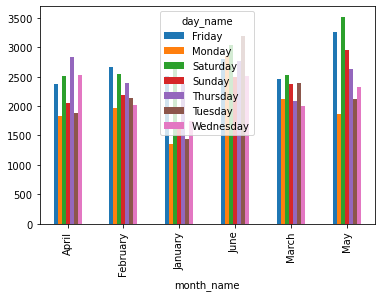

In [16]:
pivot.plot(kind='bar')

In [17]:
summary=uber_15.groupby(['day_name','hour'],as_index=False).size()

<AxesSubplot:xlabel='hour', ylabel='size'>

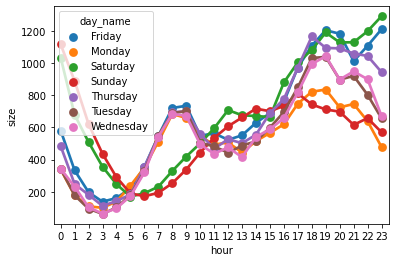

In [18]:
sns.pointplot(x="hour",y="size",hue="day_name",data=summary)

In [19]:
uber_foil = pd.read_csv(r"C:\Users\Abdullah\OneDrive - Institute of Business Administration\Documents\Datasets/Uber-Jan-Feb-FOIL.csv")

In [20]:
uber_foil.head(4)

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679


In [21]:
uber_foil.describe()

,active_vehicles,trips
count,354.000000,354.000000
mean,1307.435028,11667.316384
std,1162.510626,10648.284865
min,112.000000,629.000000
25%,296.750000,2408.500000
50%,1077.000000,9601.000000
75%,1417.000000,13711.250000
max,4395.000000,45858.000000


In [22]:
!pip install chart_studio
!pip install plotly

In [23]:
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.express as px

from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot

In [24]:
init_notebook_mode(connected=True)

In [25]:
uber_foil.columns

Index(['dispatching_base_number', 'date', 'active_vehicles', 'trips'], dtype='object')

In [26]:
fig = px.box(uber_foil, x='dispatching_base_number', y='active_vehicles')
fig.show()

In [27]:
px.box(x='dispatching_base_number', y='active_vehicles',data_frame=uber_foil)


In [28]:
files=os.listdir(r"C:\Users\Abdullah\OneDrive - Institute of Business Administration\Documents\Datasets")[-8:]
print(files)

['uber-raw-data-apr14.csv', 'uber-raw-data-aug14.csv', 'uber-raw-data-janjune-15.csv', 'uber-raw-data-janjune-15_sample.csv', 'uber-raw-data-jul14.csv', 'uber-raw-data-jun14.csv', 'uber-raw-data-may14.csv', 'uber-raw-data-sep14.csv']


In [29]:
files.pop(2)

'uber-raw-data-janjune-15.csv'

In [30]:
files.pop(3)

'uber-raw-data-jul14.csv'

In [31]:
# Create an empty DataFrame to store the concatenated data
final = pd.DataFrame()
path=r"C:\Users\Abdullah\OneDrive - Institute of Business Administration\Documents\Datasets"
# Iterate through the files and concatenate them
for file in files:
    current = pd.read_csv(path+"/"+file)  # Read each CSV file into a DataFrame
    concatenated_df = pd.concat([current, final])  # Concatenate the DataFrames


In [32]:
concatenated_df.shape

(1028136, 4)

In [33]:
concatenated_df.duplicated().sum()

24037

In [34]:
concatenated_df.drop_duplicates(inplace=True)

In [35]:
concatenated_df.head(5)

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512


In [36]:
rush_uber=concatenated_df.groupby(['Lat','Lon'],as_index=False).size()

In [37]:
!pip install folium

In [38]:
import folium

In [39]:
basemap=folium.Map()

In [40]:
basemap

In [41]:
from folium.plugins import HeatMap

In [42]:
HeatMap(rush_uber).add_to(basemap)

In [43]:
basemap

In [44]:
# Create a HeatMap layer
heatmap_layer = HeatMap(rush_uber, gradient={0.2: 'blue', 0.5: 'green', 0.8: 'yellow', 1: 'red'})
heatmap_layer

In [45]:
heatmap_layer

In [46]:
basemap

In [47]:
concatenated_df.columns

Index(['Date/Time', 'Lat', 'Lon', 'Base'], dtype='object')

In [48]:
concatenated_df.head(5)

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512


In [49]:
concatenated_df['Date/Time']

0            9/1/2014 0:01:00
1            9/1/2014 0:01:00
2            9/1/2014 0:03:00
3            9/1/2014 0:06:00
4            9/1/2014 0:11:00
                  ...        
1028131    9/30/2014 22:57:00
1028132    9/30/2014 22:57:00
1028133    9/30/2014 22:58:00
1028134    9/30/2014 22:58:00
1028135    9/30/2014 22:58:00
Name: Date/Time, Length: 1004099, dtype: object

In [50]:
pd.to_datetime(concatenated_df['Date/Time'], format="%m/%d/%Y %H:%M:%S")

0         2014-09-01 00:01:00
1         2014-09-01 00:01:00
2         2014-09-01 00:03:00
3         2014-09-01 00:06:00
4         2014-09-01 00:11:00
                  ...        
1028131   2014-09-30 22:57:00
1028132   2014-09-30 22:57:00
1028133   2014-09-30 22:58:00
1028134   2014-09-30 22:58:00
1028135   2014-09-30 22:58:00
Name: Date/Time, Length: 1004099, dtype: datetime64[ns]

In [51]:
concatenated_df['Date/Time'] = pd.to_datetime(concatenated_df['Date/Time'], format="%m/%d/%Y %H:%M:%S")

In [52]:
concatenated_df['Date/Time'].dtype

dtype('<M8[ns]')

In [53]:
concatenated_df['day']=concatenated_df['Date/Time'].dt.day
concatenated_df['hour']=concatenated_df['Date/Time'].dt.hour

In [54]:
pivot=concatenated_df.groupby(['day','hour']).size().unstack()

In [55]:
pivot

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,,,,
1,682.0,480.0,356.0,329.0,260.0,278.0,327.0,416.0,551.0,748.0,851.0,967.0,1001.0,1102.0,1199.0,1324.0,1452.0,1319.0,1234.0,1229.0,1157.0,1027.0,794.0,498.0
2,204.0,108.0,81.0,288.0,511.0,843.0,1241.0,1565.0,1689.0,1229.0,1132.0,1110.0,1170.0,1256.0,1375.0,1677.0,2009.0,2099.0,1920.0,1725.0,1732.0,1485.0,1106.0,684.0
3,278.0,150.0,113.0,200.0,351.0,744.0,1359.0,1633.0,1640.0,1372.0,1213.0,1157.0,1186.0,1343.0,1603.0,1997.0,2290.0,2414.0,2329.0,2136.0,2172.0,1886.0,1543.0,898.0
4,484.0,263.0,177.0,244.0,374.0,744.0,1336.0,1707.0,1770.0,1428.0,1363.0,1369.0,1385.0,1510.0,1828.0,2285.0,2441.0,2674.0,3012.0,2740.0,2568.0,2388.0,2033.0,1384.0
5,634.0,359.0,229.0,298.0,456.0,806.0,1302.0,1677.0,1824.0,1578.0,1456.0,1399.0,1415.0,1675.0,2020.0,2279.0,2601.0,2899.0,3087.0,3099.0,2683.0,2727.0,2702.0,2252.0
6,1664.0,1092.0,690.0,466.0,340.0,337.0,516.0,696.0,942.0,1068.0,1259.0,1440.0,1563.0,1828.0,2098.0,2365.0,2528.0,2717.0,2802.0,2686.0,2369.0,2657.0,2975.0,2597.0
7,1794.0,1219.0,805.0,556.0,328.0,352.0,382.0,555.0,801.0,1006.0,1207.0,1356.0,1459.0,1604.0,1764.0,1944.0,2091.0,1995.0,1865.0,1662.0,1574.0,1410.0,1135.0,622.0
8,321.0,199.0,155.0,365.0,508.0,897.0,1194.0,1646.0,1692.0,1272.0,1175.0,1190.0,1162.0,1313.0,1547.0,1855.0,2054.0,2203.0,2171.0,1926.0,1782.0,1453.0,1090.0,583.0
9,305.0,192.0,145.0,239.0,398.0,807.0,1410.0,1745.0,1751.0,1305.0,1263.0,1258.0,1287.0,1600.0,1986.0,2191.0,2195.0,2559.0,2618.0,2329.0,2130.0,1875.0,1393.0,838.0


In [56]:
pivot.style.background_gradient()

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,,,,
1,682.000000,480.000000,356.000000,329.000000,260.000000,278.000000,327.000000,416.000000,551.000000,748.000000,851.000000,967.000000,1001.000000,1102.000000,1199.000000,1324.000000,1452.000000,1319.000000,1234.000000,1229.000000,1157.000000,1027.000000,794.000000,498.000000
2,204.000000,108.000000,81.000000,288.000000,511.000000,843.000000,1241.000000,1565.000000,1689.000000,1229.000000,1132.000000,1110.000000,1170.000000,1256.000000,1375.000000,1677.000000,2009.000000,2099.000000,1920.000000,1725.000000,1732.000000,1485.000000,1106.000000,684.000000
3,278.000000,150.000000,113.000000,200.000000,351.000000,744.000000,1359.000000,1633.000000,1640.000000,1372.000000,1213.000000,1157.000000,1186.000000,1343.000000,1603.000000,1997.000000,2290.000000,2414.000000,2329.000000,2136.000000,2172.000000,1886.000000,1543.000000,898.000000
4,484.000000,263.000000,177.000000,244.000000,374.000000,744.000000,1336.000000,1707.000000,1770.000000,1428.000000,1363.000000,1369.000000,1385.000000,1510.000000,1828.000000,2285.000000,2441.000000,2674.000000,3012.000000,2740.000000,2568.000000,2388.000000,2033.000000,1384.000000
5,634.000000,359.000000,229.000000,298.000000,456.000000,806.000000,1302.000000,1677.000000,1824.000000,1578.000000,1456.000000,1399.000000,1415.000000,1675.000000,2020.000000,2279.000000,2601.000000,2899.000000,3087.000000,3099.000000,2683.000000,2727.000000,2702.000000,2252.000000
6,1664.000000,1092.000000,690.000000,466.000000,340.000000,337.000000,516.000000,696.000000,942.000000,1068.000000,1259.000000,1440.000000,1563.000000,1828.000000,2098.000000,2365.000000,2528.000000,2717.000000,2802.000000,2686.000000,2369.000000,2657.000000,2975.000000,2597.000000
7,1794.000000,1219.000000,805.000000,556.000000,328.000000,352.000000,382.000000,555.000000,801.000000,1006.000000,1207.000000,1356.000000,1459.000000,1604.000000,1764.000000,1944.000000,2091.000000,1995.000000,1865.000000,1662.000000,1574.000000,1410.000000,1135.000000,622.000000
8,321.000000,199.000000,155.000000,365.000000,508.000000,897.000000,1194.000000,1646.000000,1692.000000,1272.000000,1175.000000,1190.000000,1162.000000,1313.000000,1547.000000,1855.000000,2054.000000,2203.000000,2171.000000,1926.000000,1782.000000,1453.000000,1090.000000,583.000000
9,305.000000,192.000000,145.000000,239.000000,398.000000,807.000000,1410.000000,1745.000000,1751.000000,1305.000000,1263.000000,1258.000000,1287.000000,1600.000000,1986.000000,2191.000000,2195.000000,2559.000000,2618.000000,2329.000000,2130.000000,1875.000000,1393.000000,838.000000
